<a href="https://colab.research.google.com/github/darthwaydr007/gan/blob/master/GAN_feature_extractor_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import numpy as np
import torchvision
if torch.cuda.is_available():    
    device = torch.device("cuda")
    print('There are %d GPU available.' % torch.cuda.device_count())
    print('GPU:', torch.cuda.get_device_name(0))
else:
    print('No GPU')
    device = torch.device("cpu")
    

There are 1 GPU available.
GPU: Tesla K80


In [ ]:
BATCH_SIZE = 64
# MNIST Dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5), std=(0.5))])

mnist_train = datasets.MNIST(root='/content/drive/My Drive/MNIST', train=True, download=False, transform=transform)
mnist_test = datasets.MNIST(root='/content/drive/My Drive/MNIST', train=False, download=False, transform=transform)

train_loader = torch.utils.data.DataLoader(mnist_train , batch_size = BATCH_SIZE, shuffle = True , drop_last=True)
test_loader = torch.utils.data.DataLoader(mnist_test , batch_size = BATCH_SIZE , shuffle = False , drop_last=True)

In [ ]:
class Generator(nn.Module):
    def __init__(self, g_input_dim, g_output_dim):
        super().__init__()       
        self.model = nn.Sequential(
        nn.Linear(g_input_dim, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 784),
            nn.Tanh()
    ) 
    def forward(self, x): 
        x = self.model(x)
        return x.cuda()
    
class Discriminator(nn.Module):
    def __init__(self, d_input_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(784, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),
            nn.Linear(256, 128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2)
        )
        self.regular = nn.Sequential(
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.model(x.view(x.size(0),784))
        disc_output = self.regular(x)
        #disc_fearures = self.features(x)
        return {
            'disc_output' : disc_output.cuda(),
            'disc_fearures' : x.cuda()
        }

In [ ]:
z_dim = 100
mnist_dim = mnist_train.train_data.size(1) * mnist_train.train_data.size(2)

G = Generator(g_input_dim = z_dim, g_output_dim = mnist_dim).to(device)
D = Discriminator(mnist_dim).to(device)

/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:55: UserWarning: train_data has been renamed data
  warnings.warn("train_data has been renamed data")


In [ ]:
# loss
#criterion = nn.NLLLoss() 
criterion = nn.BCELoss() 
softmax = nn.Softmax()
# optimizer
lr = 0.0002 
G_optimizer = optim.Adam(G.parameters(), lr = lr)
D_optimizer = optim.Adam(D.parameters(), lr = lr)

In [ ]:
def D_train(x , label):
    #=======================Train the discriminator=======================#
    G.train()
    D.train()
    D.zero_grad()

    # train discriminator on real
    x_real, y_real = x.view(-1, mnist_dim).cuda(), torch.ones(BATCH_SIZE, 1).cuda()

    z = torch.randn(BATCH_SIZE, z_dim).to(device)
    x_fake, y_fake = G(z), torch.zeros(BATCH_SIZE, 1).to(device)
    
    data = D(x_real)
    D_output1 = data['disc_output']
    D_real_loss = criterion((D_output1), y_real)
    D_real_score = D_output1

    # train discriminator on facke
    data = D(x_fake)
    D_output2 = data['disc_output']
    D_fake_loss = criterion((D_output2), y_fake)
    D_fake_score = D_output2

    # gradient backprop & optimize ONLY D's parameters
    D_loss = D_real_loss + D_fake_loss
    D_loss.backward()
    D_optimizer.step()
        
    return  D_loss.data.item() , D_output1.mean().item() , D_output2.mean().item()

In [ ]:
def G_train(x , label):
    #=======================Train the generator=======================#
    G.train()
    D.train()
    G.zero_grad()


    z = torch.randn(BATCH_SIZE, z_dim).cuda()
    y0 = torch.ones(BATCH_SIZE, 1).cuda()
    y1 = torch.zeros(BATCH_SIZE, 1).cuda()

    G_output = G(z)
    data = D(G_output)
    D_output = data['disc_output']
    #G_loss = criterion(1-D_output, fake_label)
    G_loss = criterion(D_output, y0)

    # gradient backprop & optimize ONLY G's parameters
    G_loss.backward()
    G_optimizer.step()
        
    return G_loss.data.item() , G_output , D_output.mean().item()

In [ ]:
def display_grid(images):
    grid_img = torchvision.utils.make_grid(images , nrow=8)
    npimgs = grid_img.cpu().detach().numpy()
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(npimgs, (1,2,0)), cmap='gray')
    plt.show()

/usr/local/lib/python3.6/dist-packages/torch/tensor.py:365: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


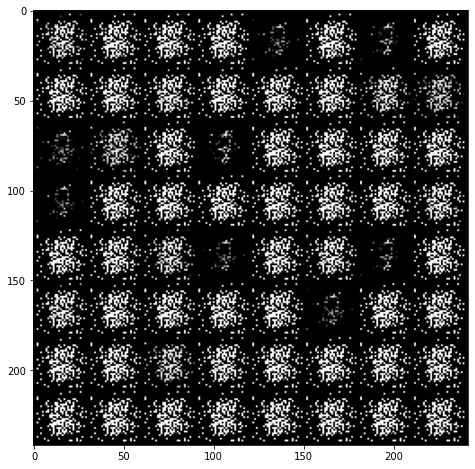

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


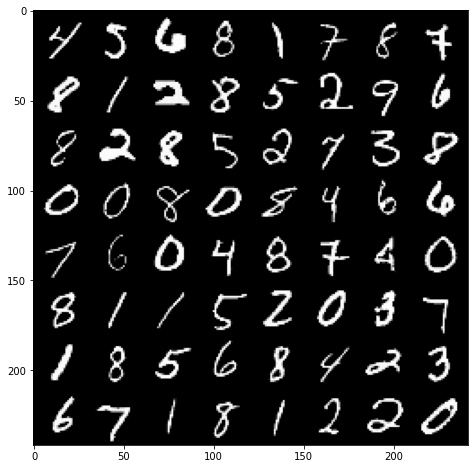

D(X) : 0.954874575138092   || D(G(Z1)) : 0.026476820930838585 || D(G(Z2)) : 0.03759282827377319 
[1/50]: loss_d: 0.485, loss_g: 9.356


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


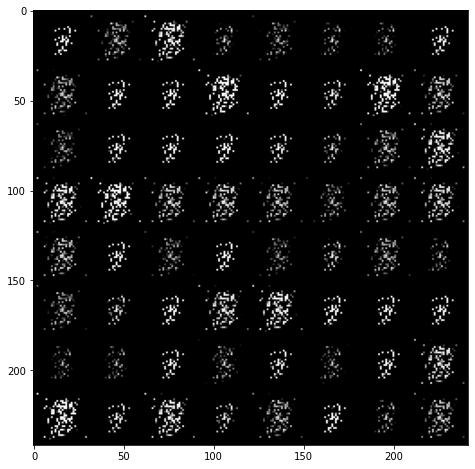

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


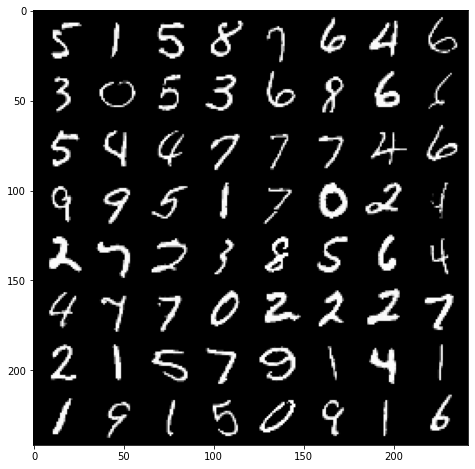

D(X) : 0.9920753836631775   || D(G(Z1)) : 0.006880774162709713 || D(G(Z2)) : 0.0004396758449729532 
[2/50]: loss_d: 0.129, loss_g: 12.471


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


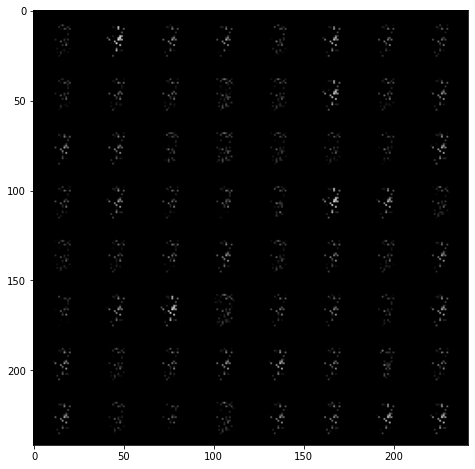

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


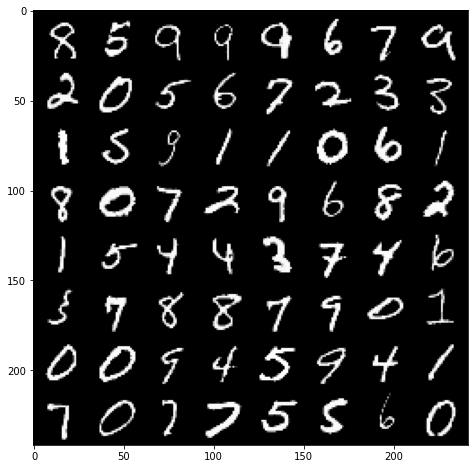

D(X) : 0.9267596006393433   || D(G(Z1)) : 0.09720860421657562 || D(G(Z2)) : 0.04181512072682381 
[3/50]: loss_d: 0.395, loss_g: 4.434


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


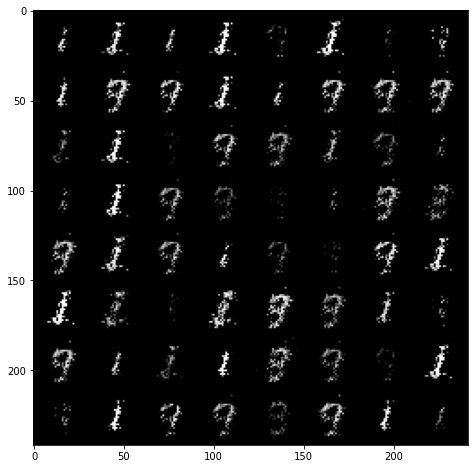

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


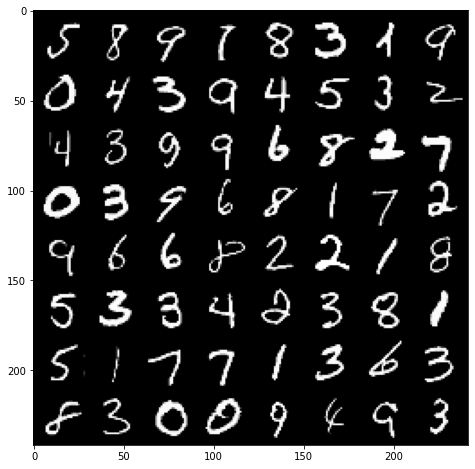

D(X) : 0.939773678779602   || D(G(Z1)) : 0.07003610581159592 || D(G(Z2)) : 0.02608652599155903 
[4/50]: loss_d: 0.313, loss_g: 4.109


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


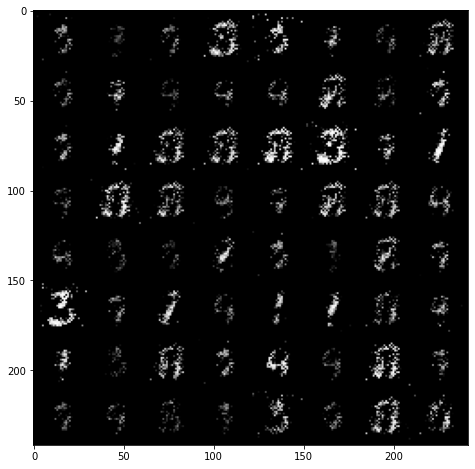

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


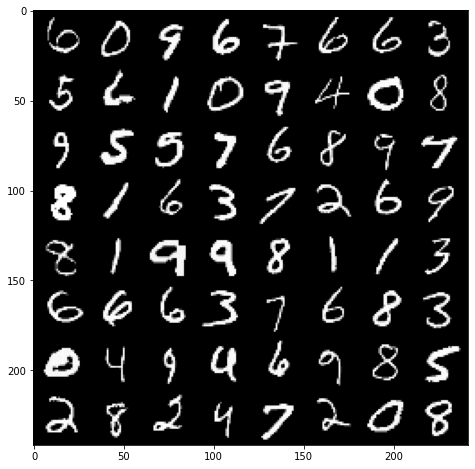

D(X) : 0.9521753787994385   || D(G(Z1)) : 0.29871684312820435 || D(G(Z2)) : 0.09850779175758362 
[5/50]: loss_d: 0.353, loss_g: 3.989


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


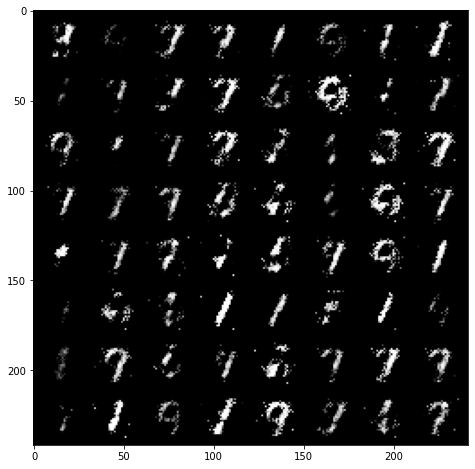

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


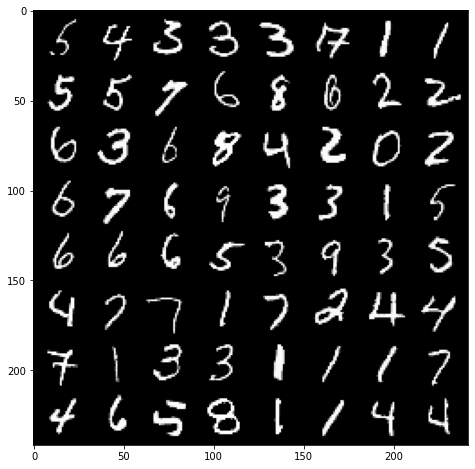

D(X) : 0.9271466135978699   || D(G(Z1)) : 0.3074592351913452 || D(G(Z2)) : 0.07742136716842651 
[6/50]: loss_d: 0.438, loss_g: 3.395


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


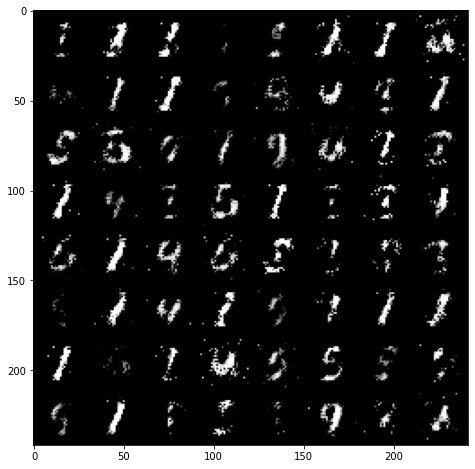

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


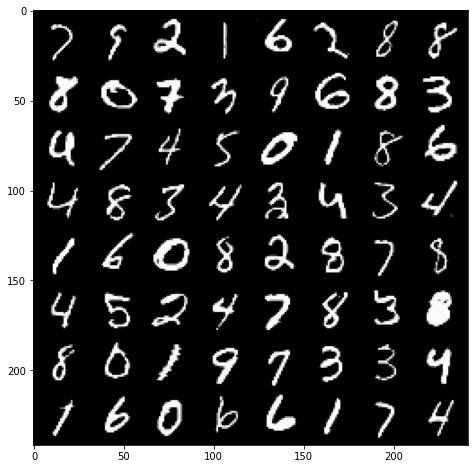

D(X) : 0.8550766706466675   || D(G(Z1)) : 0.1197236105799675 || D(G(Z2)) : 0.10816922783851624 
[7/50]: loss_d: 0.534, loss_g: 2.840


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


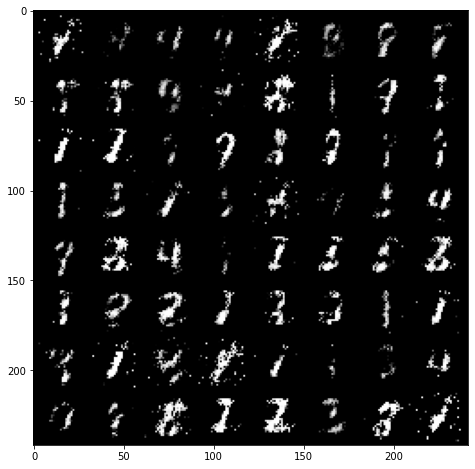

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


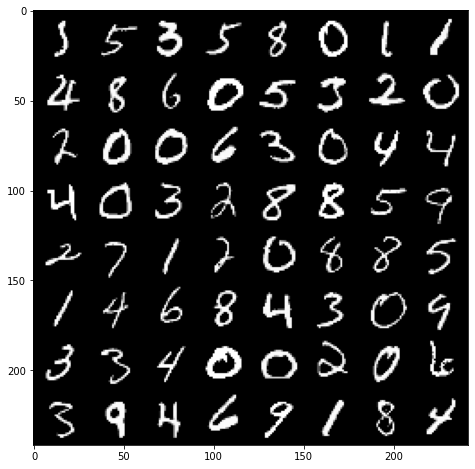

D(X) : 0.8531490564346313   || D(G(Z1)) : 0.25366178154945374 || D(G(Z2)) : 0.24922442436218262 
[8/50]: loss_d: 0.566, loss_g: 2.639


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


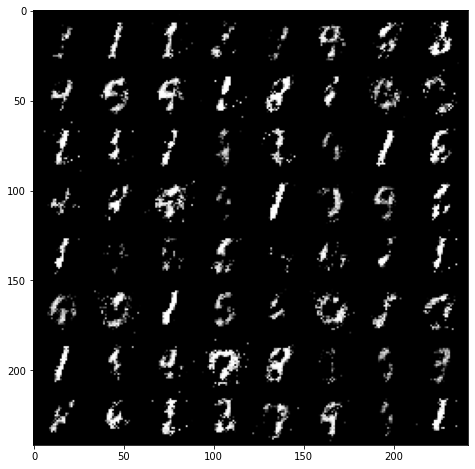

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


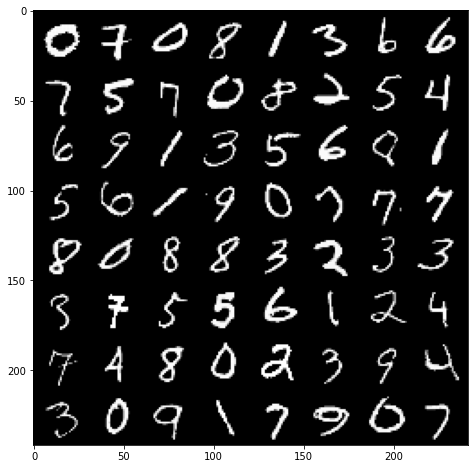

D(X) : 0.8774758577346802   || D(G(Z1)) : 0.22261978685855865 || D(G(Z2)) : 0.17340436577796936 
[9/50]: loss_d: 0.656, loss_g: 2.379


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


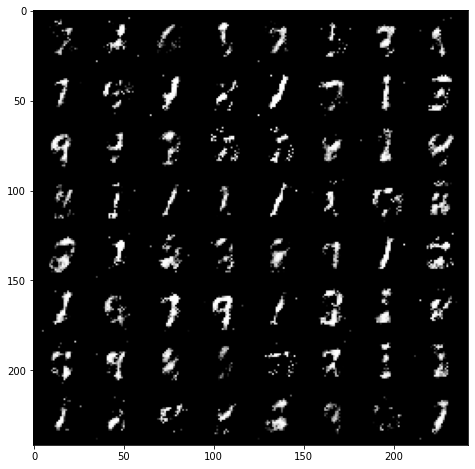

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


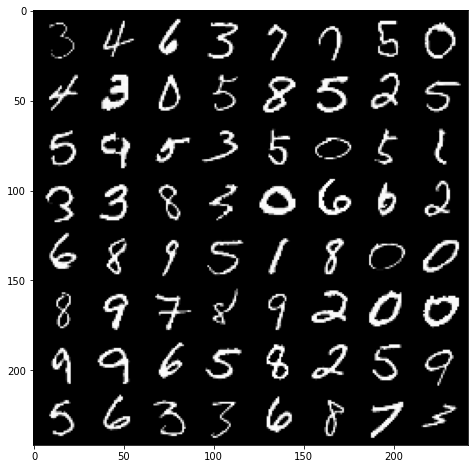

D(X) : 0.9020876884460449   || D(G(Z1)) : 0.3524515628814697 || D(G(Z2)) : 0.24153926968574524 
[10/50]: loss_d: 0.700, loss_g: 2.144


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


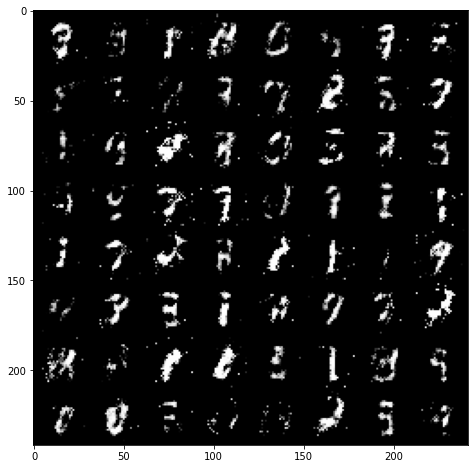

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


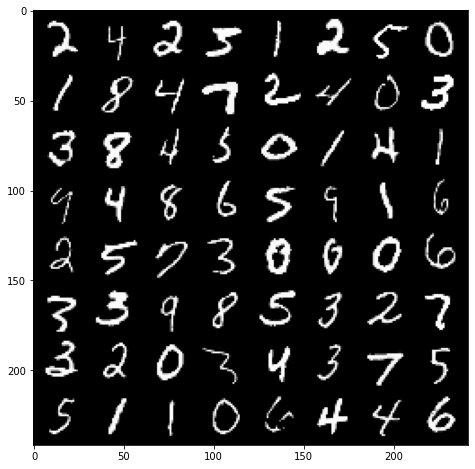

D(X) : 0.6106249690055847   || D(G(Z1)) : 0.12249938398599625 || D(G(Z2)) : 0.1918421983718872 
[11/50]: loss_d: 0.723, loss_g: 2.128


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


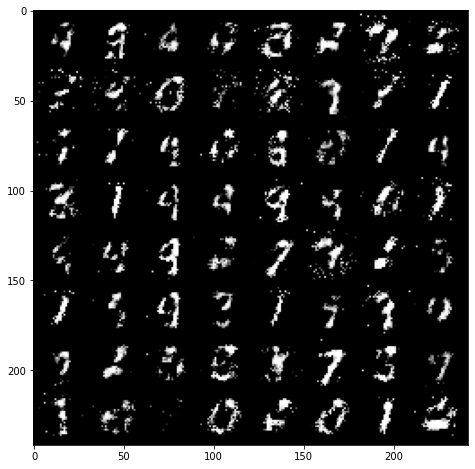

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


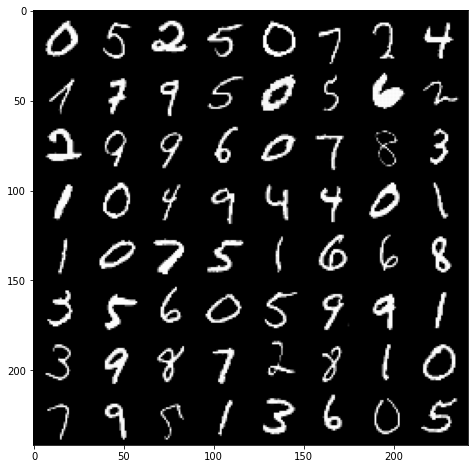

D(X) : 0.7456645965576172   || D(G(Z1)) : 0.1903446912765503 || D(G(Z2)) : 0.2222784459590912 
[12/50]: loss_d: 0.785, loss_g: 1.985


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


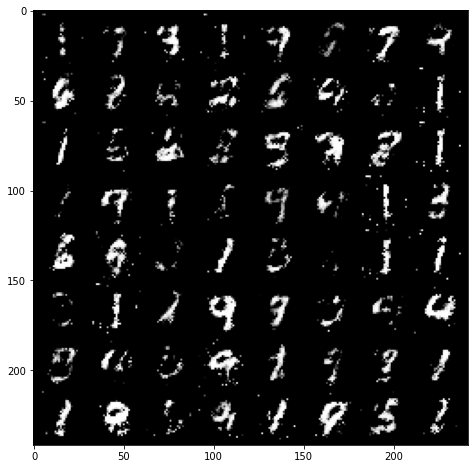

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


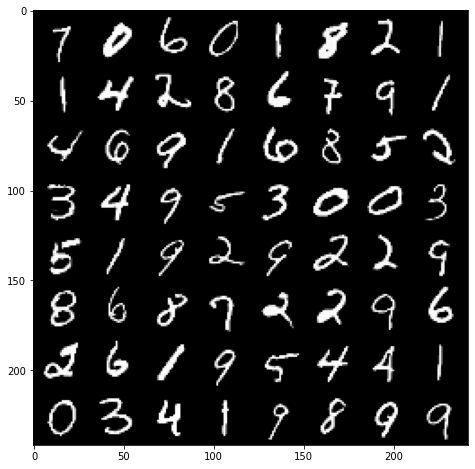

D(X) : 0.7760248184204102   || D(G(Z1)) : 0.297902375459671 || D(G(Z2)) : 0.29527074098587036 
[13/50]: loss_d: 0.772, loss_g: 1.981


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


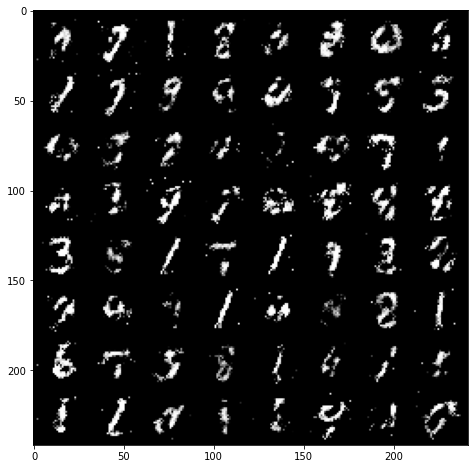

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


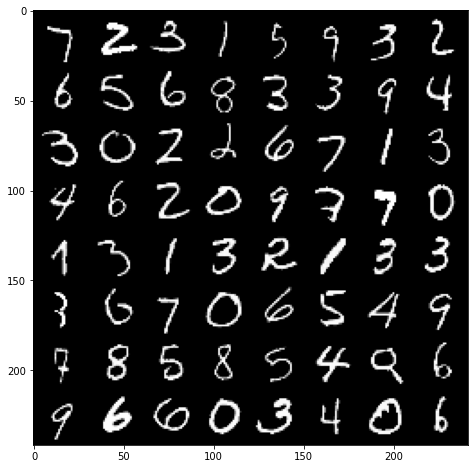

D(X) : 0.6895829439163208   || D(G(Z1)) : 0.2623915374279022 || D(G(Z2)) : 0.22632521390914917 
[14/50]: loss_d: 0.829, loss_g: 1.812


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


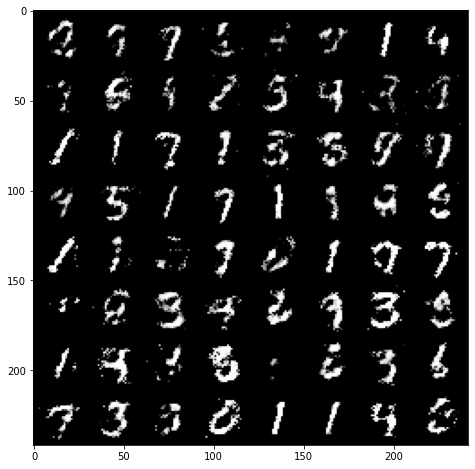

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


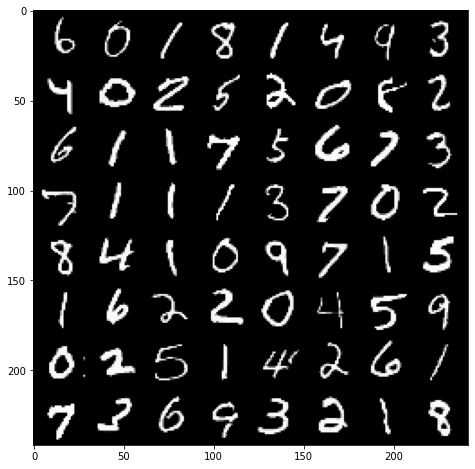

D(X) : 0.8019657135009766   || D(G(Z1)) : 0.2945942282676697 || D(G(Z2)) : 0.27621927857398987 
[15/50]: loss_d: 0.887, loss_g: 1.642


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


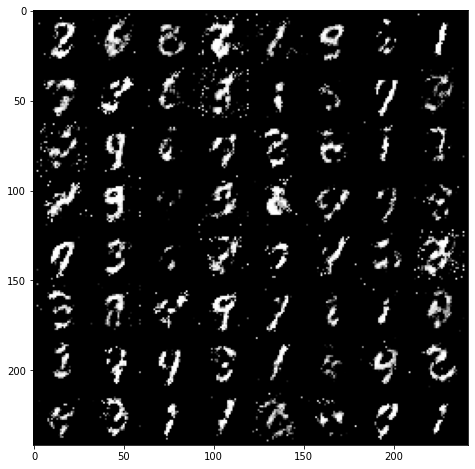

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


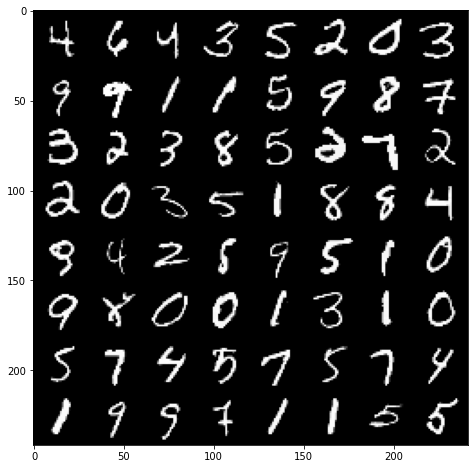

D(X) : 0.718580961227417   || D(G(Z1)) : 0.15469904243946075 || D(G(Z2)) : 0.11081849038600922 
[16/50]: loss_d: 0.856, loss_g: 1.705


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


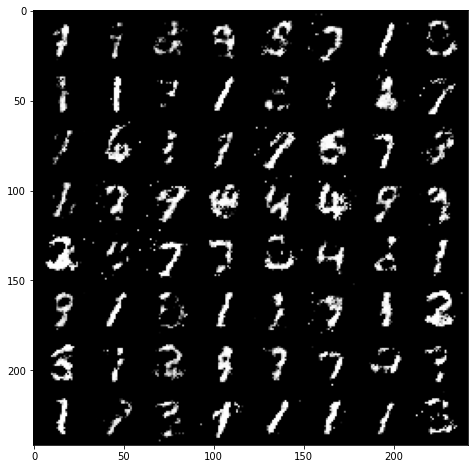

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


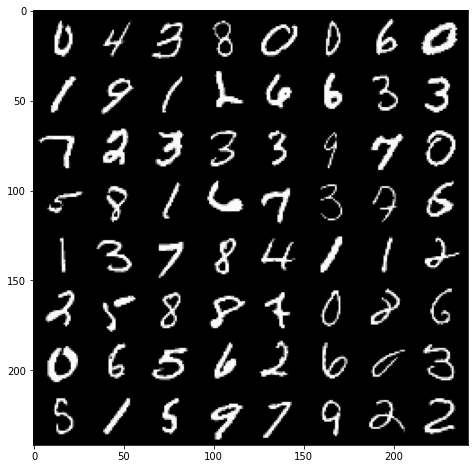

D(X) : 0.6435916423797607   || D(G(Z1)) : 0.2096112072467804 || D(G(Z2)) : 0.3699161410331726 
[17/50]: loss_d: 0.913, loss_g: 1.578


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


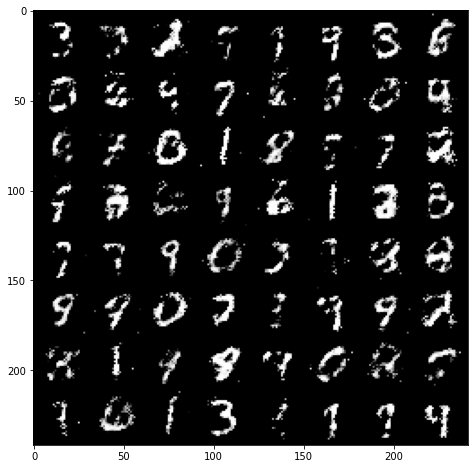

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


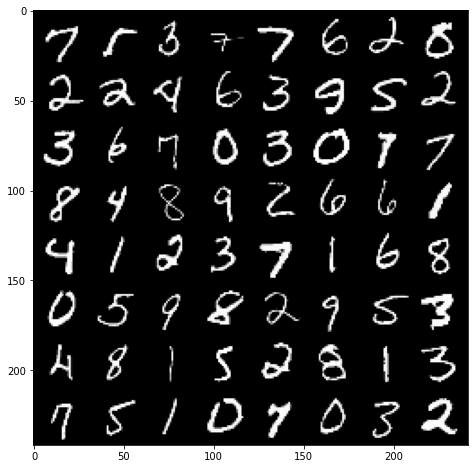

D(X) : 0.6176580190658569   || D(G(Z1)) : 0.27934080362319946 || D(G(Z2)) : 0.2942999005317688 
[18/50]: loss_d: 0.938, loss_g: 1.519


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


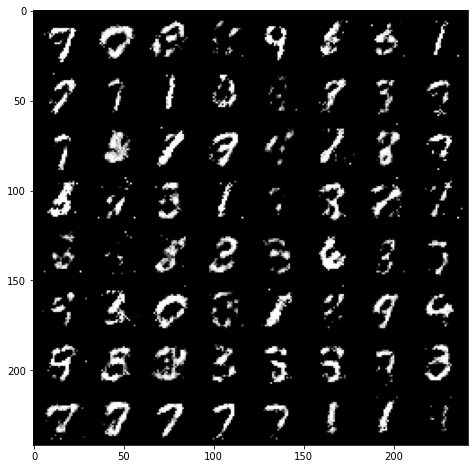

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


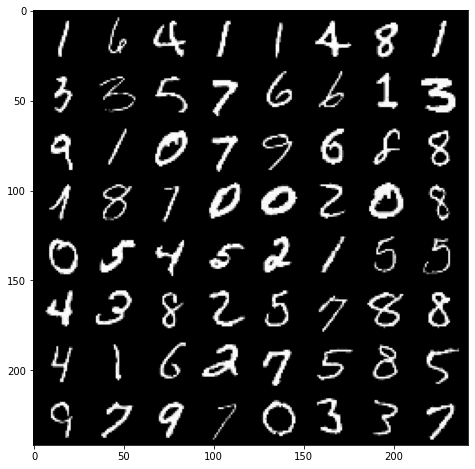

D(X) : 0.7264131903648376   || D(G(Z1)) : 0.3991217315196991 || D(G(Z2)) : 0.3802027404308319 
[19/50]: loss_d: 0.962, loss_g: 1.474


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


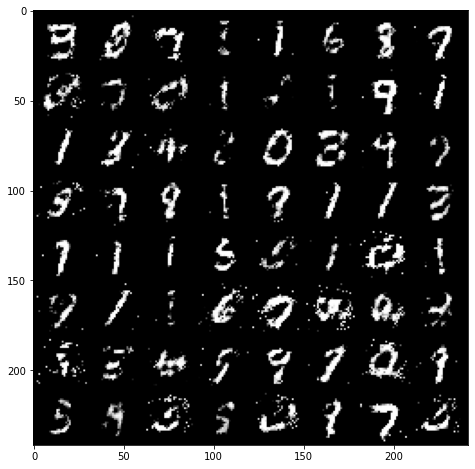

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


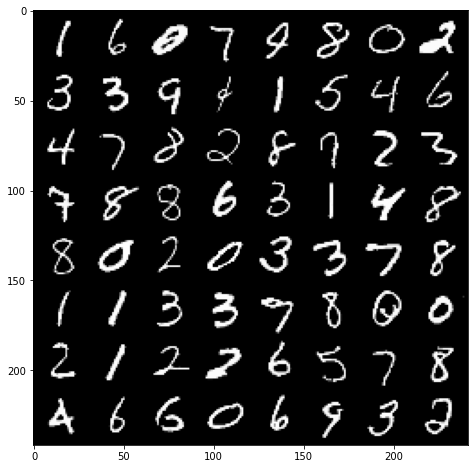

D(X) : 0.6280271410942078   || D(G(Z1)) : 0.3117065727710724 || D(G(Z2)) : 0.25795233249664307 
[20/50]: loss_d: 0.999, loss_g: 1.402


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


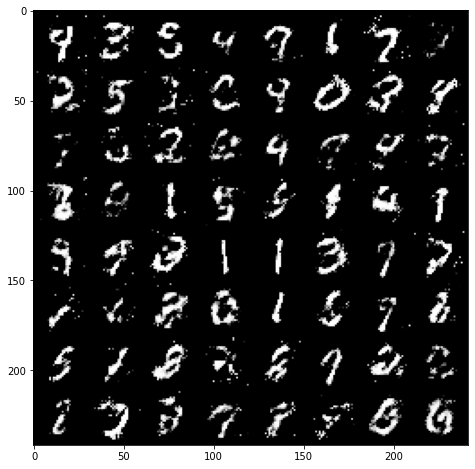

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


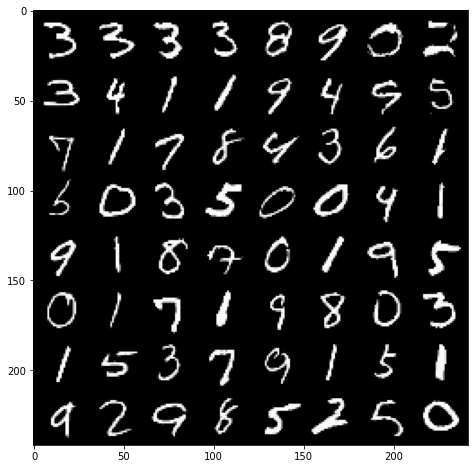

D(X) : 0.6815935969352722   || D(G(Z1)) : 0.20914077758789062 || D(G(Z2)) : 0.2803260087966919 
[21/50]: loss_d: 0.997, loss_g: 1.405


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


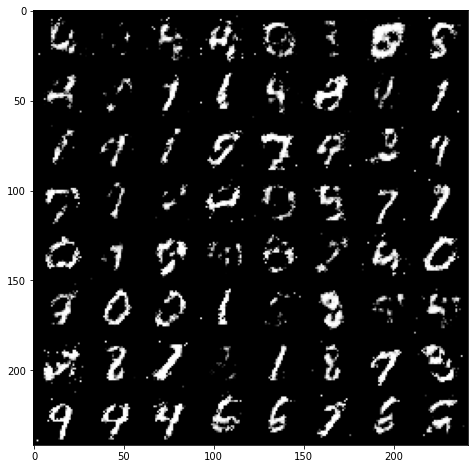

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


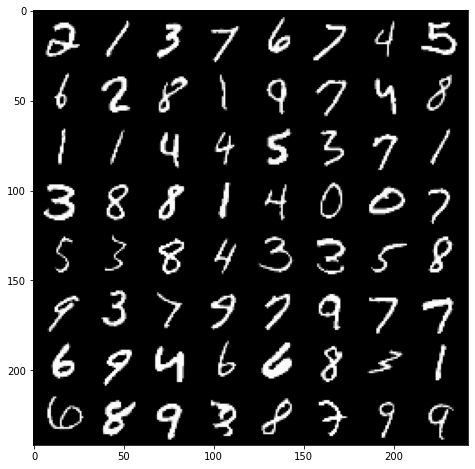

D(X) : 0.7675328254699707   || D(G(Z1)) : 0.4699191451072693 || D(G(Z2)) : 0.31454795598983765 
[22/50]: loss_d: 0.997, loss_g: 1.393


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


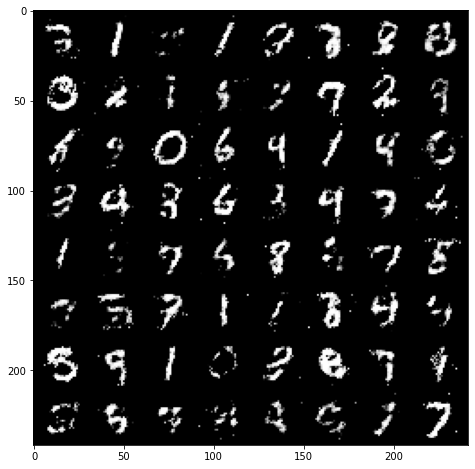

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


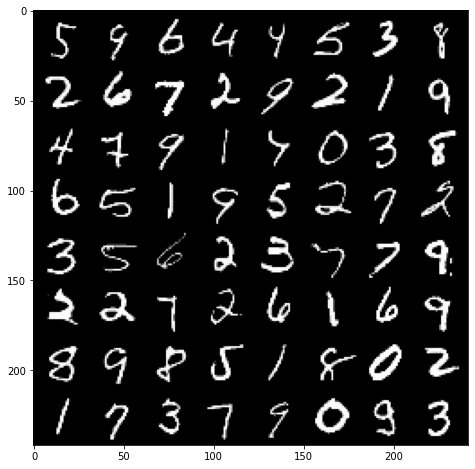

D(X) : 0.6843368411064148   || D(G(Z1)) : 0.2769453525543213 || D(G(Z2)) : 0.3907381296157837 
[23/50]: loss_d: 1.024, loss_g: 1.338


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


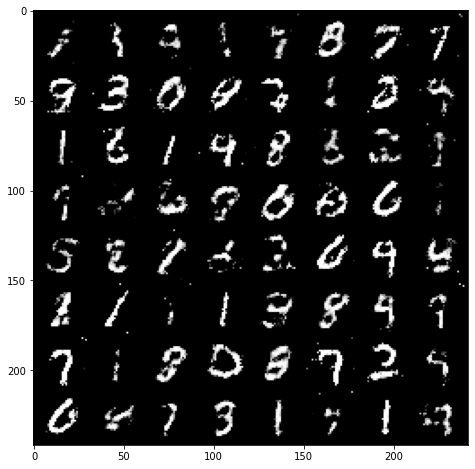

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


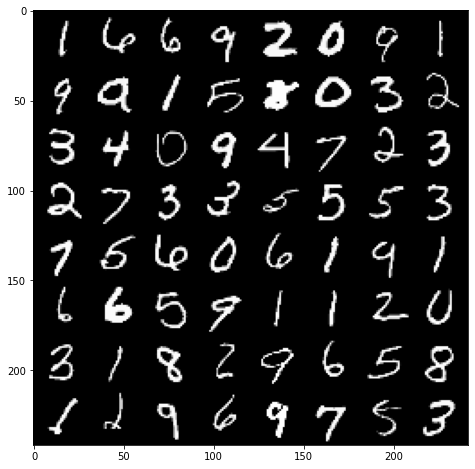

D(X) : 0.6975986957550049   || D(G(Z1)) : 0.3375089764595032 || D(G(Z2)) : 0.3616963028907776 
[24/50]: loss_d: 1.064, loss_g: 1.252


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


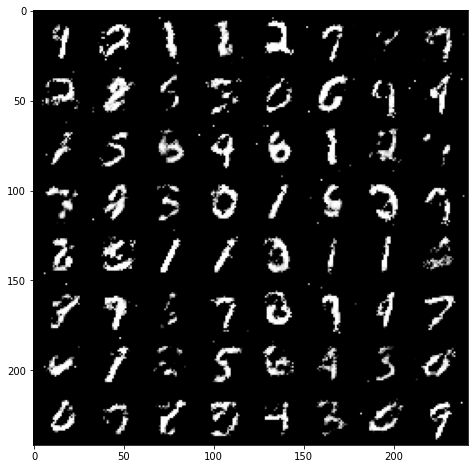

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


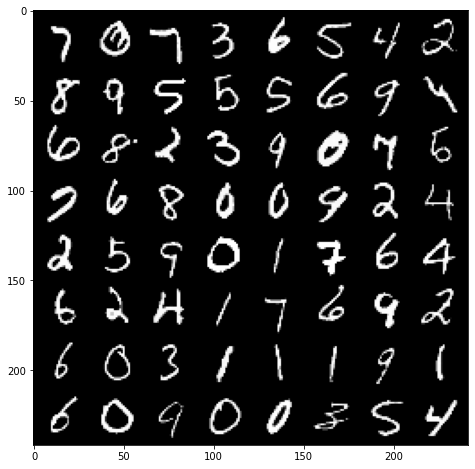

D(X) : 0.6251254677772522   || D(G(Z1)) : 0.31792280077934265 || D(G(Z2)) : 0.2767834961414337 
[25/50]: loss_d: 1.071, loss_g: 1.263


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


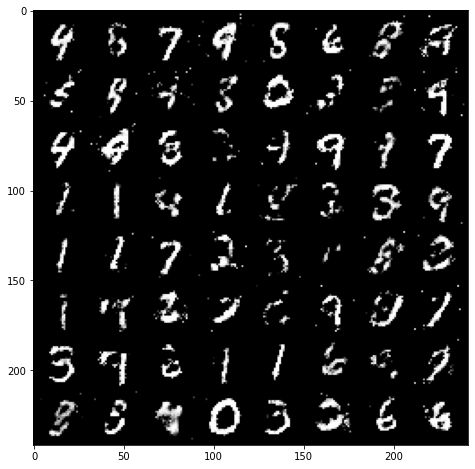

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


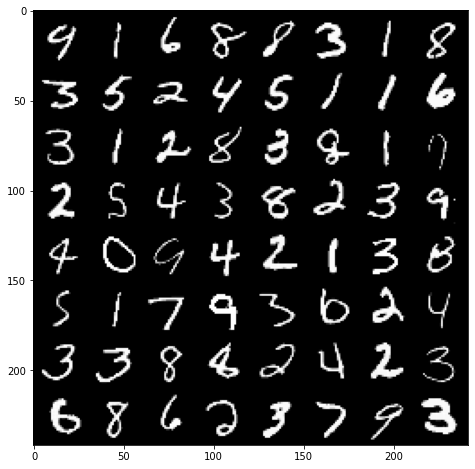

D(X) : 0.6993938684463501   || D(G(Z1)) : 0.37841126322746277 || D(G(Z2)) : 0.3066684603691101 
[26/50]: loss_d: 1.086, loss_g: 1.206


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


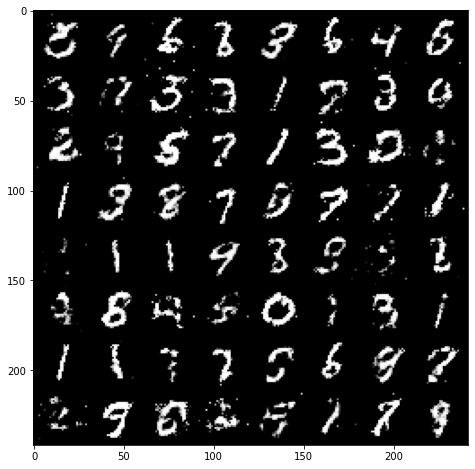

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


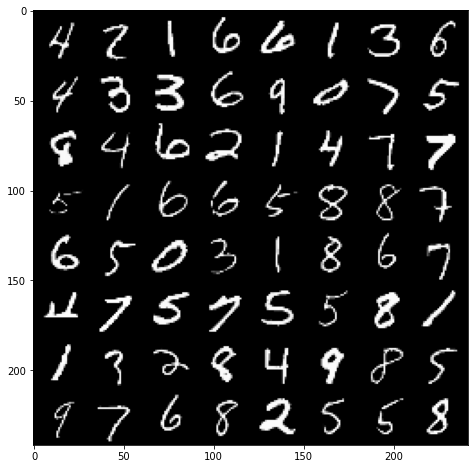

D(X) : 0.701941728591919   || D(G(Z1)) : 0.34942537546157837 || D(G(Z2)) : 0.32716721296310425 
[27/50]: loss_d: 1.089, loss_g: 1.228


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


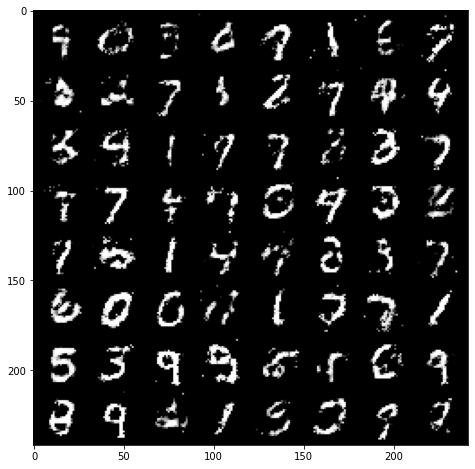

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


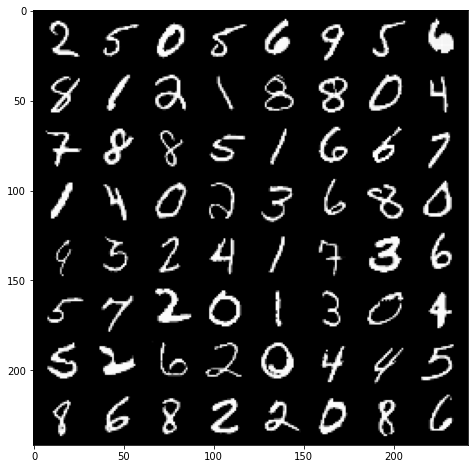

D(X) : 0.7210942506790161   || D(G(Z1)) : 0.3645418882369995 || D(G(Z2)) : 0.29734688997268677 
[28/50]: loss_d: 1.106, loss_g: 1.179


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


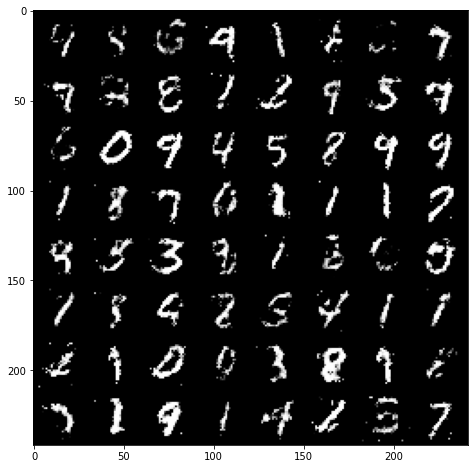

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


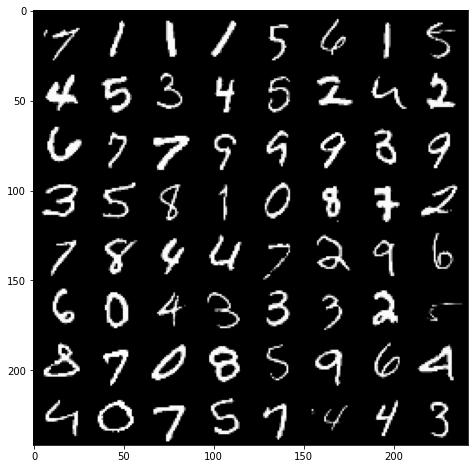

D(X) : 0.6606530547142029   || D(G(Z1)) : 0.36891186237335205 || D(G(Z2)) : 0.30870646238327026 
[29/50]: loss_d: 1.122, loss_g: 1.155


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


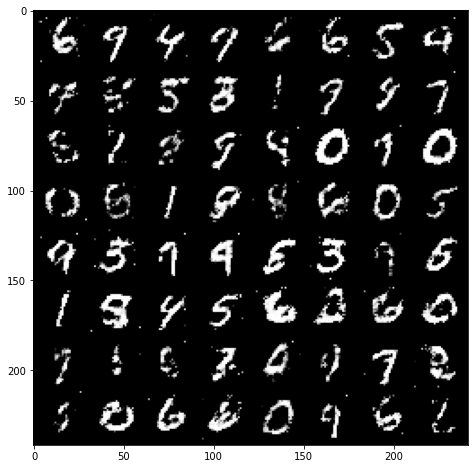

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


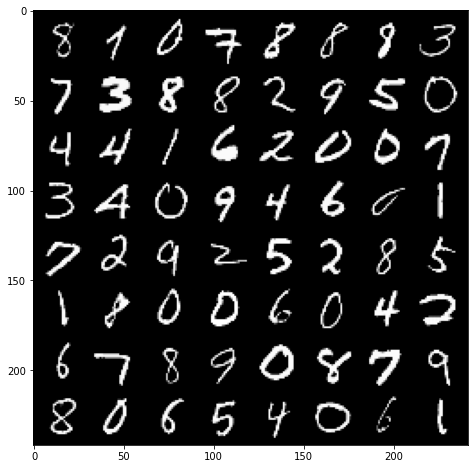

D(X) : 0.6217578649520874   || D(G(Z1)) : 0.4098072052001953 || D(G(Z2)) : 0.44992077350616455 
[30/50]: loss_d: 1.124, loss_g: 1.147


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


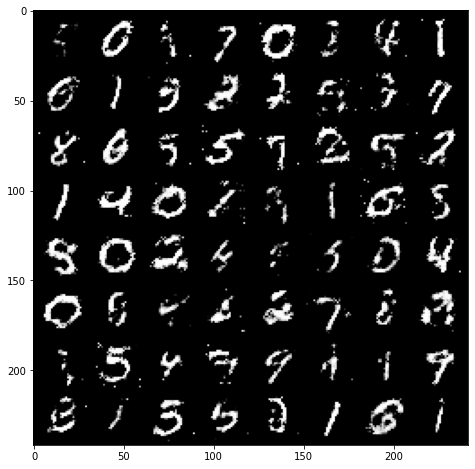

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


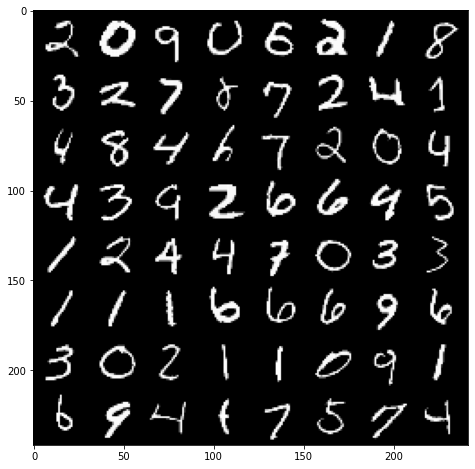

D(X) : 0.6268916726112366   || D(G(Z1)) : 0.34834906458854675 || D(G(Z2)) : 0.35700514912605286 
[31/50]: loss_d: 1.145, loss_g: 1.111


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


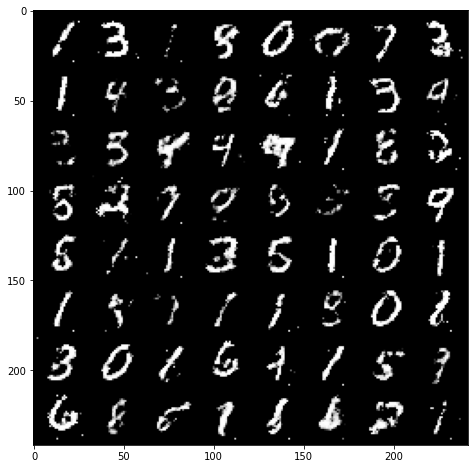

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


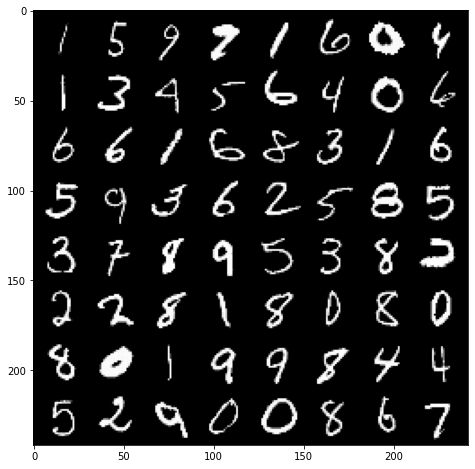

D(X) : 0.6117762327194214   || D(G(Z1)) : 0.4415363669395447 || D(G(Z2)) : 0.5192345380783081 
[32/50]: loss_d: 1.148, loss_g: 1.121


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


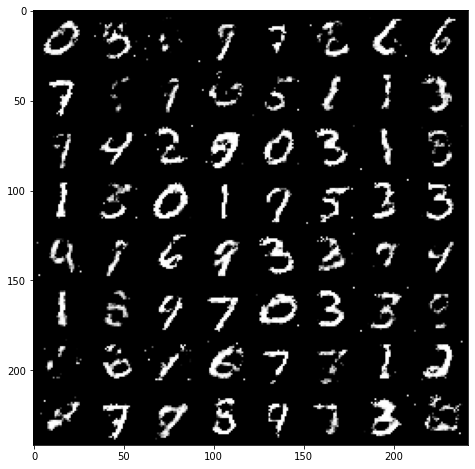

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


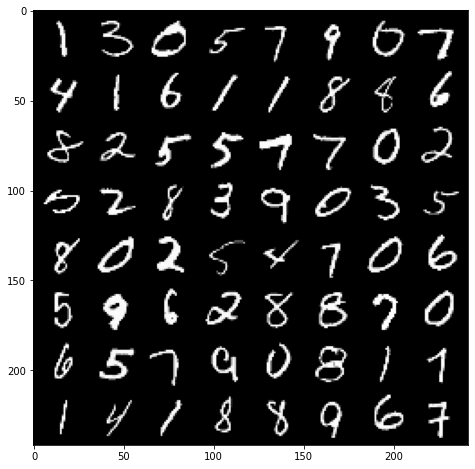

D(X) : 0.6252503991127014   || D(G(Z1)) : 0.38599562644958496 || D(G(Z2)) : 0.43156981468200684 
[33/50]: loss_d: 1.139, loss_g: 1.120


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


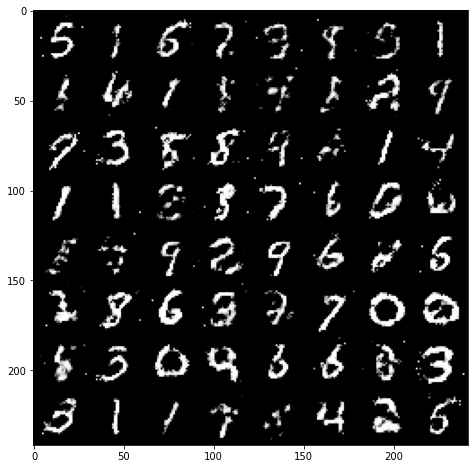

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


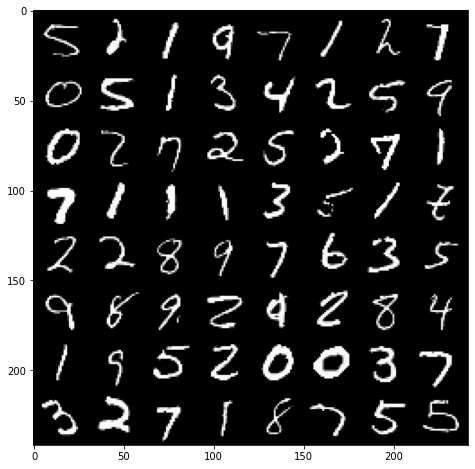

D(X) : 0.6169723868370056   || D(G(Z1)) : 0.39342421293258667 || D(G(Z2)) : 0.43661680817604065 
[34/50]: loss_d: 1.154, loss_g: 1.092


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


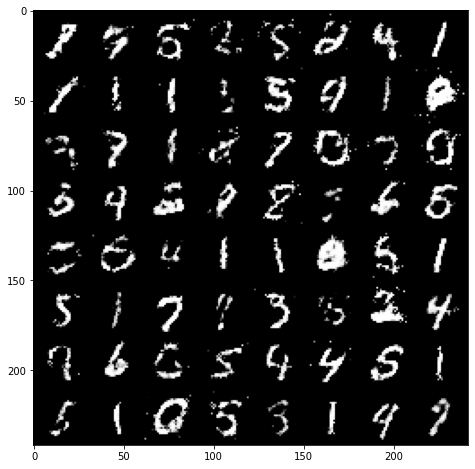

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


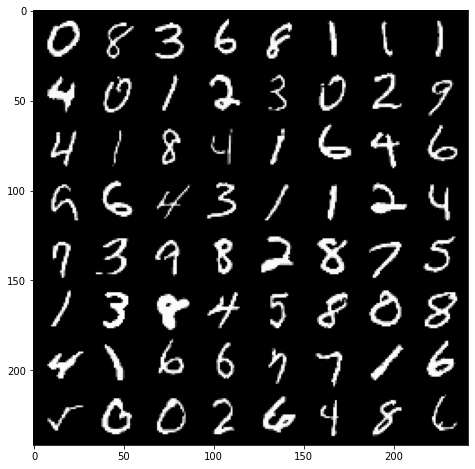

D(X) : 0.5972477197647095   || D(G(Z1)) : 0.45568370819091797 || D(G(Z2)) : 0.48445582389831543 
[35/50]: loss_d: 1.161, loss_g: 1.089


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


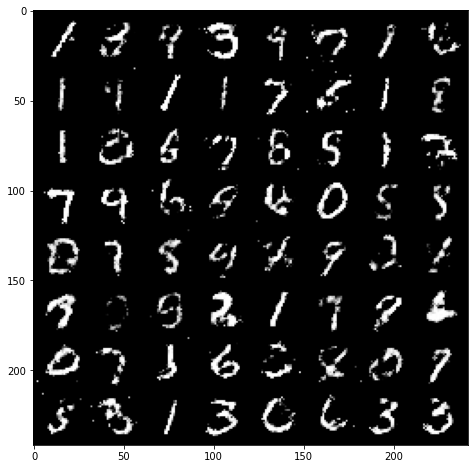

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


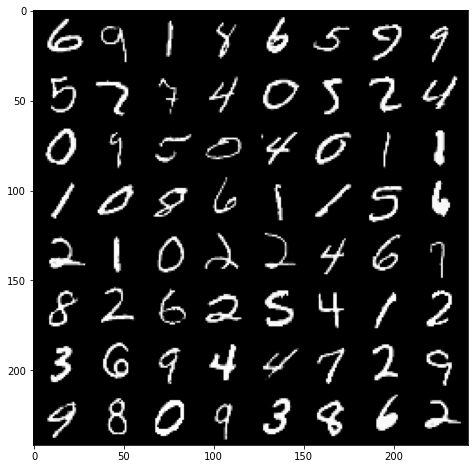

D(X) : 0.6590042114257812   || D(G(Z1)) : 0.4149054288864136 || D(G(Z2)) : 0.37047839164733887 
[36/50]: loss_d: 1.167, loss_g: 1.068


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


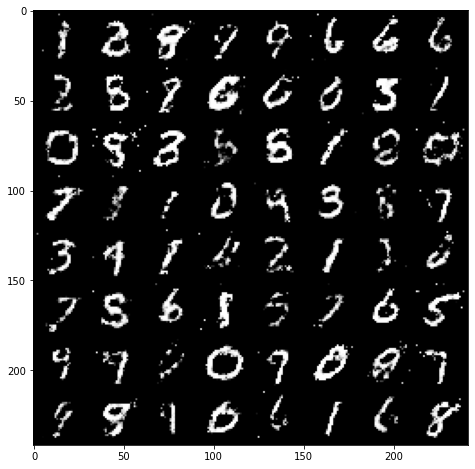

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


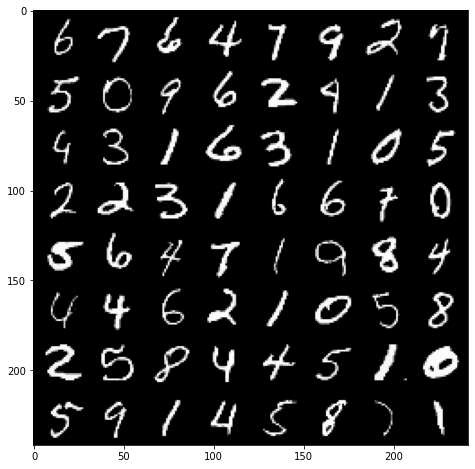

D(X) : 0.5573970079421997   || D(G(Z1)) : 0.3525562584400177 || D(G(Z2)) : 0.3618374466896057 
[37/50]: loss_d: 1.168, loss_g: 1.067


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


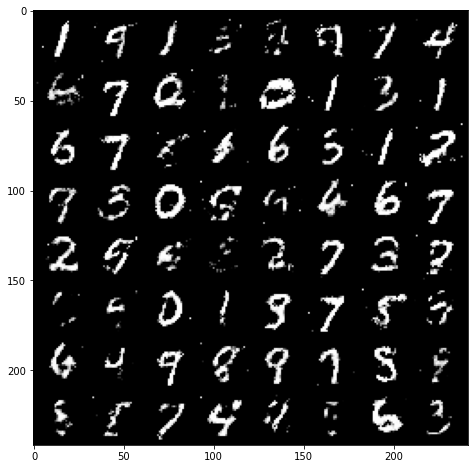

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


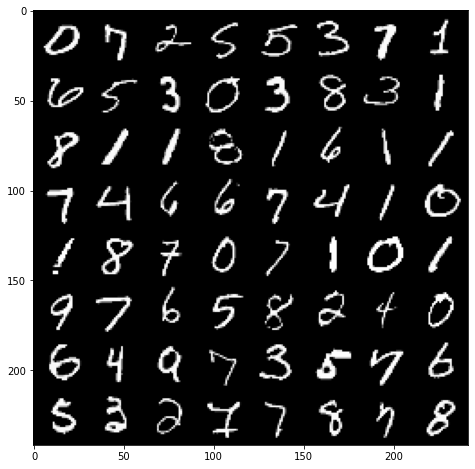

D(X) : 0.4966531991958618   || D(G(Z1)) : 0.39818084239959717 || D(G(Z2)) : 0.36859840154647827 
[38/50]: loss_d: 1.186, loss_g: 1.047


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


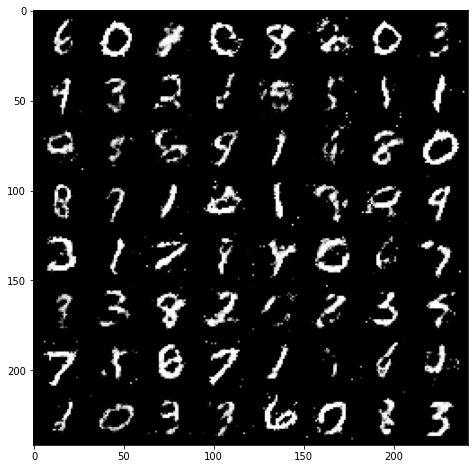

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


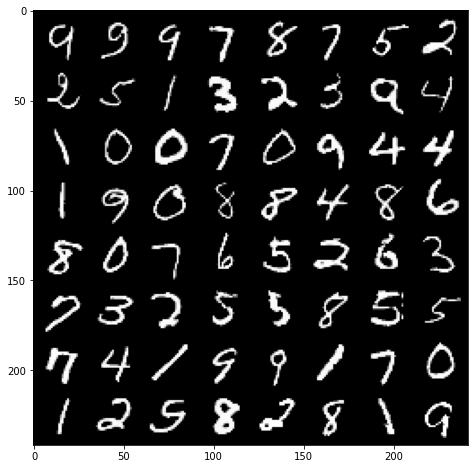

D(X) : 0.6182576417922974   || D(G(Z1)) : 0.394533634185791 || D(G(Z2)) : 0.338619202375412 
[39/50]: loss_d: 1.185, loss_g: 1.050


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


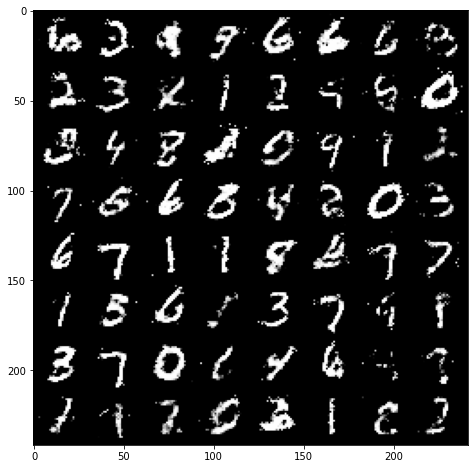

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


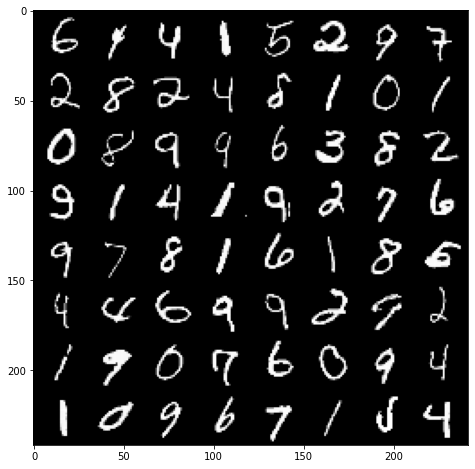

D(X) : 0.5999473333358765   || D(G(Z1)) : 0.37676143646240234 || D(G(Z2)) : 0.33147674798965454 
[40/50]: loss_d: 1.162, loss_g: 1.088


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


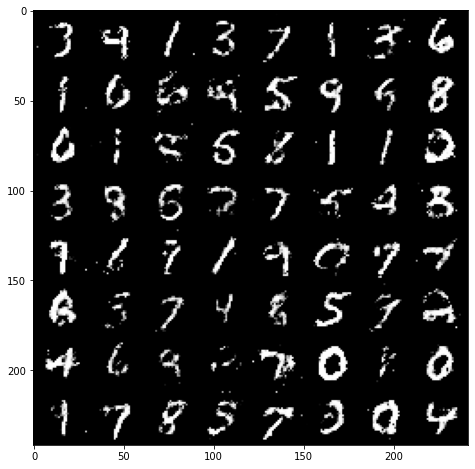

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


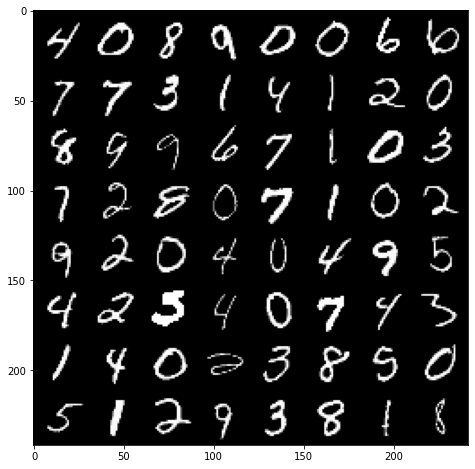

D(X) : 0.5816445350646973   || D(G(Z1)) : 0.40369048714637756 || D(G(Z2)) : 0.32548022270202637 
[41/50]: loss_d: 1.163, loss_g: 1.086


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


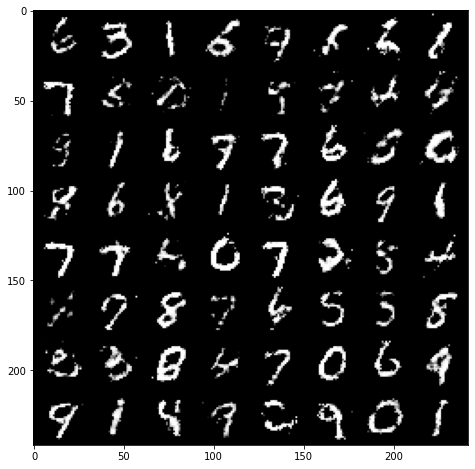

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


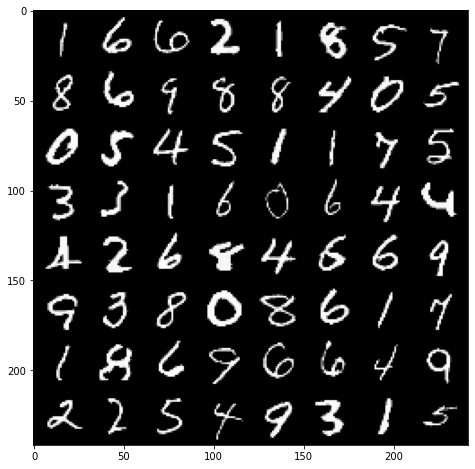

D(X) : 0.4982517659664154   || D(G(Z1)) : 0.32790082693099976 || D(G(Z2)) : 0.3410649597644806 
[42/50]: loss_d: 1.183, loss_g: 1.048


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


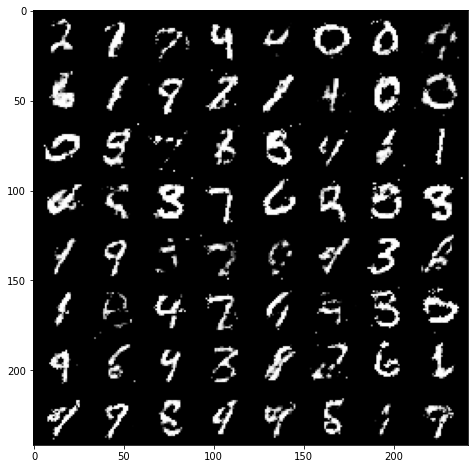

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


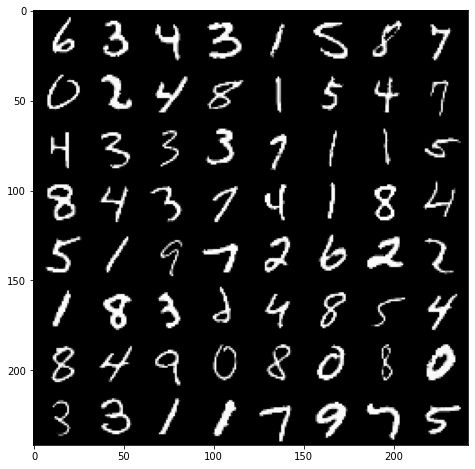

D(X) : 0.6418530941009521   || D(G(Z1)) : 0.4414082467556 || D(G(Z2)) : 0.4712141752243042 
[43/50]: loss_d: 1.196, loss_g: 1.028


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


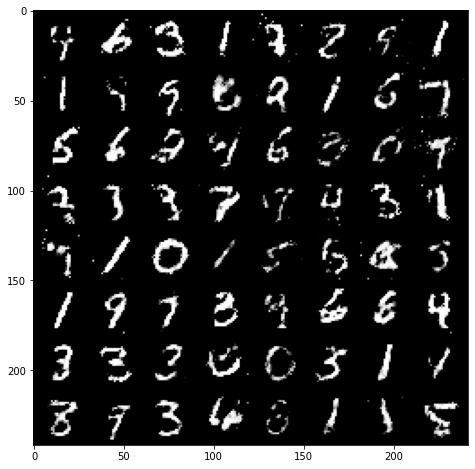

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


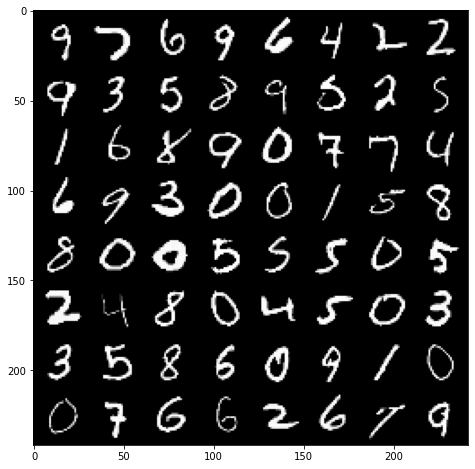

D(X) : 0.5662826299667358   || D(G(Z1)) : 0.3896383047103882 || D(G(Z2)) : 0.42757025361061096 
[44/50]: loss_d: 1.199, loss_g: 1.009


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


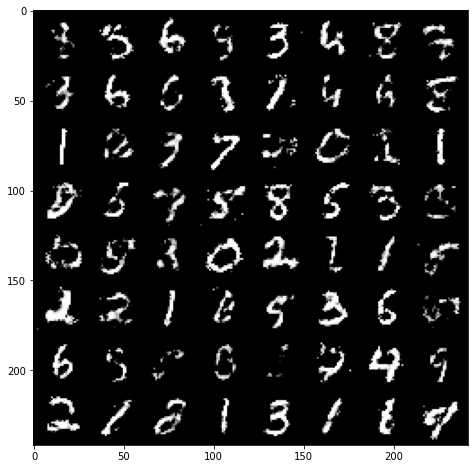

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


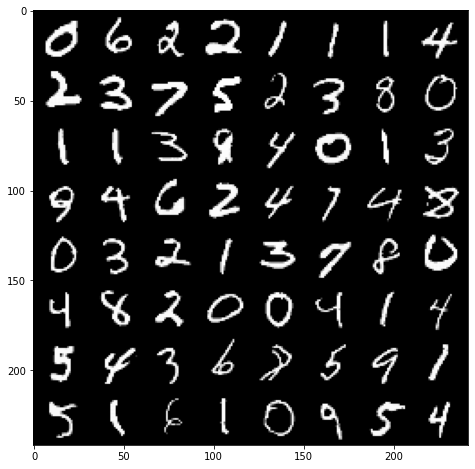

D(X) : 0.5706270933151245   || D(G(Z1)) : 0.3840996026992798 || D(G(Z2)) : 0.3653174042701721 
[45/50]: loss_d: 1.203, loss_g: 1.019


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


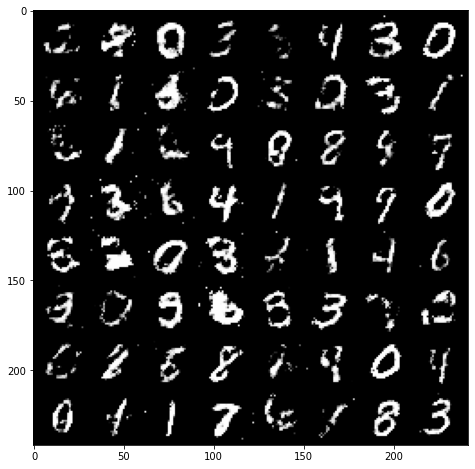

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


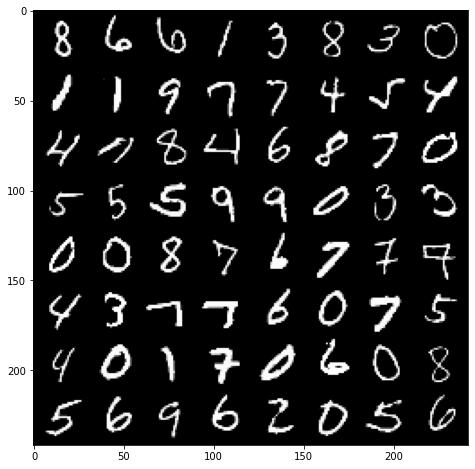

D(X) : 0.5793107748031616   || D(G(Z1)) : 0.3944792151451111 || D(G(Z2)) : 0.3890284299850464 
[46/50]: loss_d: 1.200, loss_g: 1.015


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


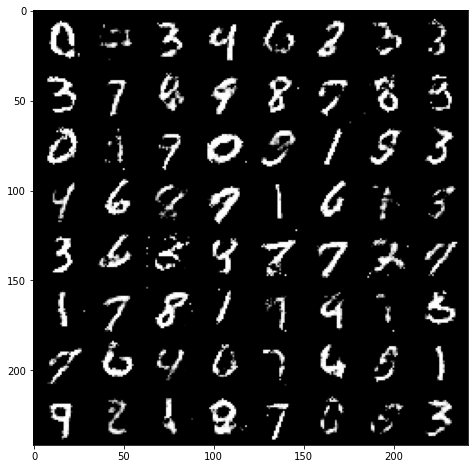

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


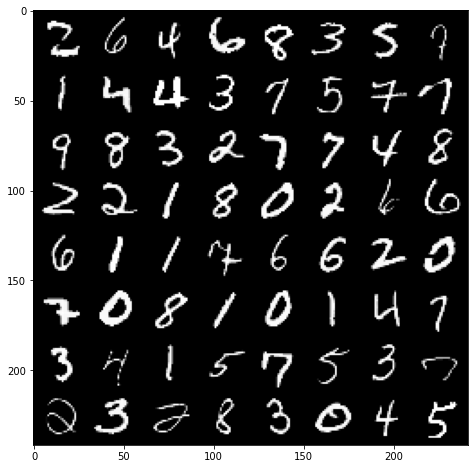

D(X) : 0.5111448764801025   || D(G(Z1)) : 0.4291455149650574 || D(G(Z2)) : 0.46903449296951294 
[47/50]: loss_d: 1.210, loss_g: 1.014


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


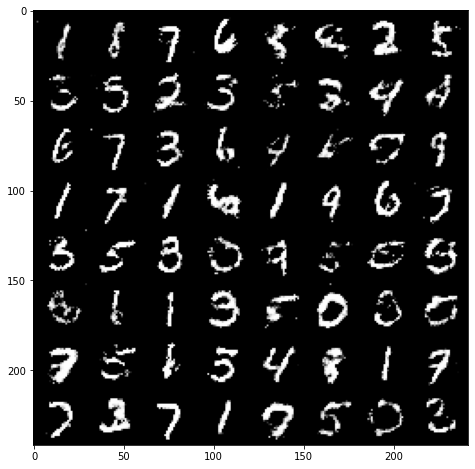

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


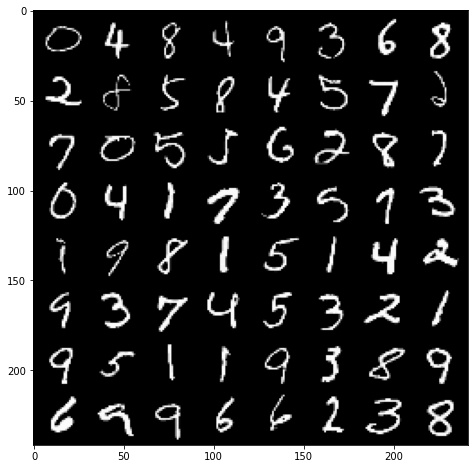

D(X) : 0.5456351041793823   || D(G(Z1)) : 0.4243776798248291 || D(G(Z2)) : 0.490547776222229 
[48/50]: loss_d: 1.204, loss_g: 1.015


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


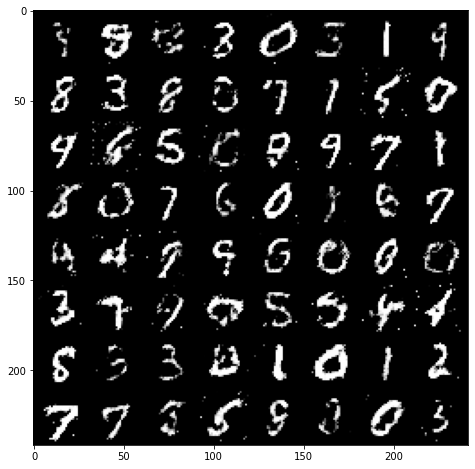

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


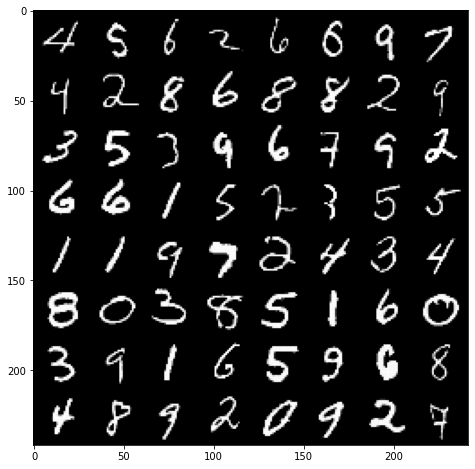

D(X) : 0.6670349836349487   || D(G(Z1)) : 0.46807533502578735 || D(G(Z2)) : 0.47961997985839844 
[49/50]: loss_d: 1.187, loss_g: 1.049


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


64


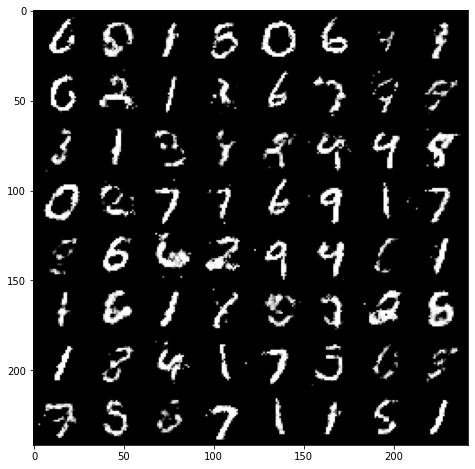

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


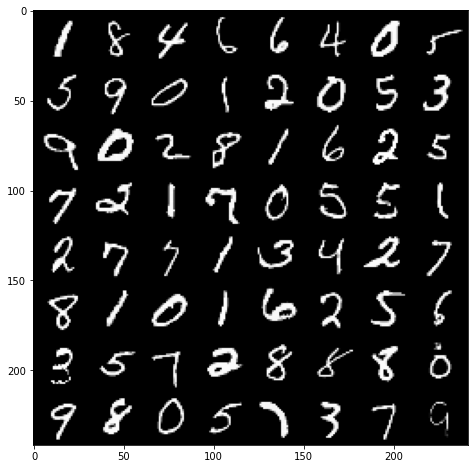

D(X) : 0.5524344444274902   || D(G(Z1)) : 0.45029187202453613 || D(G(Z2)) : 0.4279782474040985 
[50/50]: loss_d: 1.201, loss_g: 1.018


In [ ]:
n_epoch = 50

for epoch in range(1, n_epoch+1):           
    D_losses, G_losses = [], []
    for batch_idx, (x, label) in enumerate(train_loader):

        d_loss , d_val1 , d_val2= D_train(x , label)
        g_loss , g_images , g_val = G_train(x , label)
        D_losses.append(d_loss)
        G_losses.append(g_loss)
        if batch_idx % 750 == 0 and not batch_idx == 0:
          print(label.size(0))
          g_images = g_images.resize(BATCH_SIZE,1,28,28)
          display_grid(g_images)
          display_grid(x)
          print('D(X) : {:}   || D(G(Z1)) : {:} || D(G(Z2)) : {:} '.format(d_val1 , d_val2 , g_val))
   
    print('[%d/%d]: loss_d: %.3f, loss_g: %.3f' % (
            (epoch), n_epoch, torch.mean(torch.FloatTensor(D_losses)), torch.mean(torch.FloatTensor(G_losses))))

In [ ]:
class MNISTClassifier(nn.Module):
  def __init__(self):
    super().__init__()
    self.model = nn.Sequential(
        nn.Linear(128, 64),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Dropout(0.2),
        nn.Linear(64, 32),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Dropout(0.2),
        nn.Linear(32, 10),
        nn.Softmax()
    )
  def forward(self , x):
    return self.model(x.view(x.size(0),128)).cuda()


In [ ]:
classifier = MNISTClassifier().to(device)
criterion1 = nn.CrossEntropyLoss() 
lr = 0.0002 
optimizer = optim.Adam(classifier.parameters(), lr = lr)

In [ ]:
n_epoch = 10

for epoch in range(0, n_epoch+1): 
    classifier.train()
    print('======== Epoch {:} / {:} ========'.format(epoch, n_epoch))          
    #D_losses, G_losses = [], []
    for batch_idx, (x, label) in enumerate(train_loader):
        optimizer.zero_grad()

        x_real = x.view(-1, mnist_dim).cuda()
        data = D(x_real)
        D_output1 = data['disc_fearures']
        output = classifier(D_output1)
        #print(max(output[[0]]))
        #print(label)
        loss = criterion1(output , label.cuda())
        if batch_idx % 300 == 0 and not batch_idx == 0: 
          print('|| loss : {:} '.format( loss.mean().item()))   
        
        loss.backward()
        optimizer.step()
        


======== Epoch 0 / 10 ========


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:100: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


|| loss : 2.025960922241211 
|| loss : 2.0059030055999756 
|| loss : 1.920472264289856 
======== Epoch 1 / 10 ========
|| loss : 1.927834391593933 
|| loss : 1.8337130546569824 
|| loss : 1.9207836389541626 
======== Epoch 2 / 10 ========
|| loss : 1.8492162227630615 
|| loss : 1.8953078985214233 
|| loss : 1.829505205154419 
======== Epoch 3 / 10 ========
|| loss : 1.788540244102478 
|| loss : 1.966431975364685 
|| loss : 1.8471006155014038 
======== Epoch 4 / 10 ========
|| loss : 1.8690197467803955 
|| loss : 1.7849249839782715 
|| loss : 1.8207333087921143 
======== Epoch 5 / 10 ========
|| loss : 1.9502582550048828 
|| loss : 1.7636510133743286 
|| loss : 1.8688009977340698 
======== Epoch 6 / 10 ========
|| loss : 1.8688106536865234 
|| loss : 1.8327304124832153 
|| loss : 1.716959834098816 
======== Epoch 7 / 10 ========
|| loss : 1.7818652391433716 
|| loss : 1.756875991821289 
|| loss : 1.7933582067489624 
======== Epoch 8 / 10 ========
|| loss : 1.7636834383010864 
|| loss : 

In [ ]:
correct = 0
total = 0
classifier.eval()
with torch.no_grad():
  for batch_idx, (x, label) in enumerate(train_loader):
    x_real = x.view(-1, mnist_dim).cuda()
    data = D(x_real)
    D_output1 = data['disc_fearures']
    output = classifier(D_output1)
    #if batch_idx % 100 == 0 and not batch_idx == 0: 
      #for idx ,i in enumerate(output):
        
        #print('|| {:} : {:} '.format( torch.argmax(i) , label[idx]) )
    for idx ,i in enumerate(output):

      if torch.argmax(i) == label[idx]:
        correct += 1
      total += 1
print("accuracy: " , round(correct/total , 3))

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:100: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


accuracy:  0.705


In [ ]:
def fgsm(img , epsilon , data_grad):
  new_image = img + epsilon*data_grad.sign()
  new_image = torch.clamp(new_image, 0, 1)
  return new_image

In [ ]:
correct = 0
total = 0
classifier.eval()
for batch_idx, (img, label) in enumerate(test_loader):

  img = img.view(-1, mnist_dim).cuda()
  img.requires_grad = True
  data = D(img)
  D_output1 = data['disc_fearures']
  output = classifier(D_output1)
  loss = criterion1(output , label.cuda())

  classifier.zero_grad()
  loss.backward()
  data_grad = img.grad.data
  new_img = fgsm(img , 0.1 , data_grad)
  new_data = D(new_img)
  new_output1 = new_data['disc_fearures']
  new_output = classifier(new_output1)

  for idx , i in enumerate(new_output):
    if torch.argmax(i) == label[idx]:
      correct += 1
    total += 1
print("accuracy: " , round(correct/total , 3))

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:100: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


accuracy:  0.097


In [ ]:
classifier1 = MNISTClassifier().to(device)
criterion1 = nn.CrossEntropyLoss() 
lr = 0.0002 
optimizer1 = optim.Adam(classifier1.parameters(), lr = lr)

In [ ]:
n_epoch = 20

for epoch in range(0, n_epoch+1): 
    classifier1.train()
    print('======== Epoch {:} / {:} ========'.format(epoch, n_epoch))          
    #D_losses, G_losses = [], []
    for batch_idx, (x, label) in enumerate(train_loader):
        classifier1.zero_grad()

        x_real = x.view(-1, mnist_dim).cuda()
        x_real.requires_grad = True
        data = D(x_real)
        D_output1 = data['disc_fearures']
        output = classifier1(D_output1)
        loss = criterion1(output , label.cuda())
        if batch_idx % 2 == 0 and not batch_idx == 0:
          loss.backward()
          data_grad = x_real.grad.data
          x_real.requires_grad = False
          new_img = fgsm(img , 0.1 , data_grad)
          new_data = D(new_img)
          new_output1 = new_data['disc_fearures']
          new_output = classifier1(new_output1)
          new_loss = criterion1(new_output , label.cuda())

          if batch_idx % 100 == 0 and not batch_idx == 0: 
            print('|| loss_fgsm : {:} '.format( new_loss.mean().item()))   
          optimizer1.zero_grad()
          new_loss.backward()
          optimizer.step()
        else:
          x_real.requires_grad = False
          if batch_idx % 101 == 0 and not batch_idx == 0: 
            print('|| loss : {:} '.format( loss.mean().item()))   
          optimizer1.zero_grad()
          loss.backward()
          optimizer1.step()


======== Epoch 0 / 20 ========


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:100: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


|| loss_fgsm : 2.3601932525634766 
|| loss : 1.8917090892791748 
|| loss_fgsm : 2.309840440750122 
|| loss_fgsm : 2.343142032623291 
|| loss : 1.8381608724594116 
|| loss_fgsm : 2.3490467071533203 
|| loss_fgsm : 2.302340507507324 
|| loss : 1.8136539459228516 
|| loss_fgsm : 2.3159492015838623 
|| loss_fgsm : 2.3745644092559814 
|| loss : 1.8924469947814941 
|| loss_fgsm : 2.3343358039855957 
|| loss_fgsm : 2.3191521167755127 
|| loss : 1.9097181558609009 
======== Epoch 1 / 20 ========
|| loss_fgsm : 2.3659095764160156 
|| loss : 1.9025202989578247 
|| loss_fgsm : 2.4271700382232666 
|| loss_fgsm : 2.4121131896972656 
|| loss : 1.7714903354644775 
|| loss_fgsm : 2.3703551292419434 
|| loss_fgsm : 2.411566734313965 
|| loss : 1.849218487739563 
|| loss_fgsm : 2.3280417919158936 
|| loss_fgsm : 2.2867753505706787 
|| loss : 1.8050686120986938 
|| loss_fgsm : 2.3032143115997314 
|| loss_fgsm : 2.4399075508117676 
|| loss : 1.8096489906311035 
======== Epoch 2 / 20 ========
|| loss_fgsm 

In [ ]:
correct = 0
total = 0
classifier1.eval()
for batch_idx, (img, label) in enumerate(test_loader):

  img = img.view(-1, mnist_dim).cuda()
  img.requires_grad = True
  data = D(img)
  D_output1 = data['disc_fearures']
  output = classifier1(D_output1)
  loss = criterion1(output , label.cuda())

  classifier1.zero_grad()
  loss.backward()
  data_grad = img.grad.data
  new_img = fgsm(img , 0.1 , data_grad)
  new_data = D(new_img)
  new_output1 = new_data['disc_fearures']
  new_output = classifier1(new_output1)

  for idx , i in enumerate(new_output):
    if torch.argmax(i) == label[idx]:
      correct += 1
    total += 1
print("accuracy: " , round(correct/total , 3))

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:100: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


accuracy:  0.177


In [ ]:
#performance improved